In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from scipy.stats import norm
import matplotlib

import jax.numpy as jnp
from jax import config, random
import numpyro, jax
import numpyro.distributions as dist

from jnkepler.jaxttv import JaxTTV
from jnkepler.jaxttv import ttv_default_parameter_bounds, ttv_optim_curve_fit, scale_pdic
import corner

In [2]:
import pickle
import dill
import os
import pandas as pd

In [3]:
with open('jnkep_initial_fit_data.pkl', 'rb') as f:
    data = pickle.load(f)

popt = data['popt']
param_bounds = data['param_bounds']
jttv = data['jttv']

# 200 sample run

In [4]:
working_dir = os.getcwd()
data_dir = os.path.join(working_dir, "data")

file_name = 'jnkep_fit_nsteps=200.pkl'

file_path = os.path.join(data_dir, file_name)

In [5]:
with open(file_name, "rb") as f:
    mcmc = dill.load(f)

In [6]:
# Posterior samples
posterior_samples = mcmc.get_samples()

# Shape of samples
print({k: v.shape for k, v in posterior_samples.items()})

# Example: summary for 'pmass'
import numpy as np
print("pmass mean:", np.mean(posterior_samples['pmass']))
print("pmass 95% CI:", np.percentile(posterior_samples['pmass'], [2.5, 97.5]))

{'ecc': (600, 2), 'ecosw': (600, 2), 'ecosw_scaled': (600, 2), 'ediff': (600,), 'esinw': (600, 2), 'esinw_scaled': (600, 2), 'period': (600, 2), 'period_scaled': (600, 2), 'pmass': (600, 2), 'pmass_scaled': (600, 2), 'tcmodel': (600, 33), 'tic': (600, 2), 'tic_scaled': (600, 2)}
pmass mean: 7.597577813487928e-05
pmass 95% CI: [3.62722014e-05 1.21503904e-04]


## Plot models drawn from posteriors

In [7]:
samples = mcmc.get_samples()

In [8]:
means, stds = jttv.sample_means_and_stds(samples, truncate=False)

/opt/homebrew/anaconda3/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:523: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


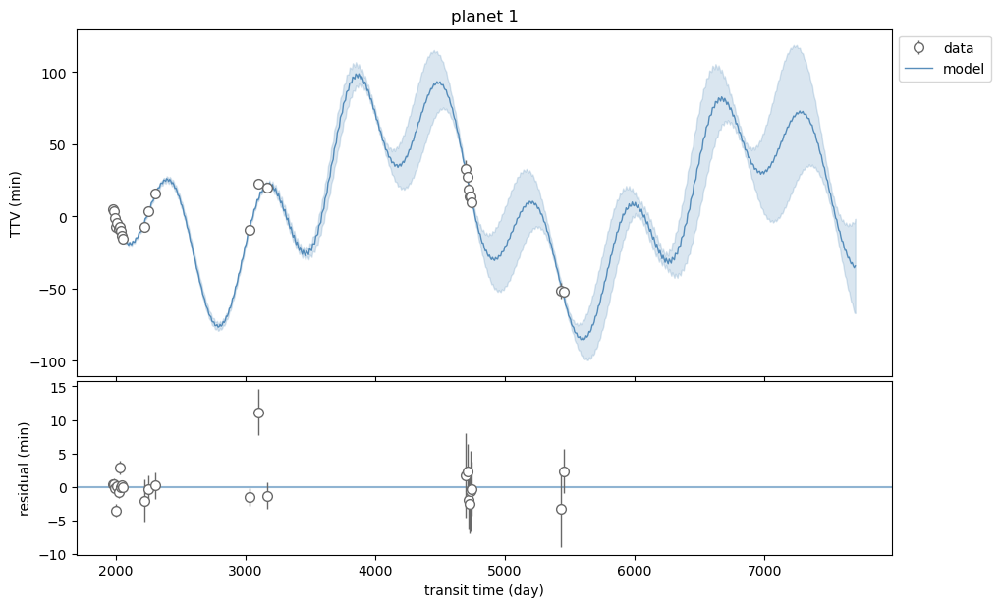

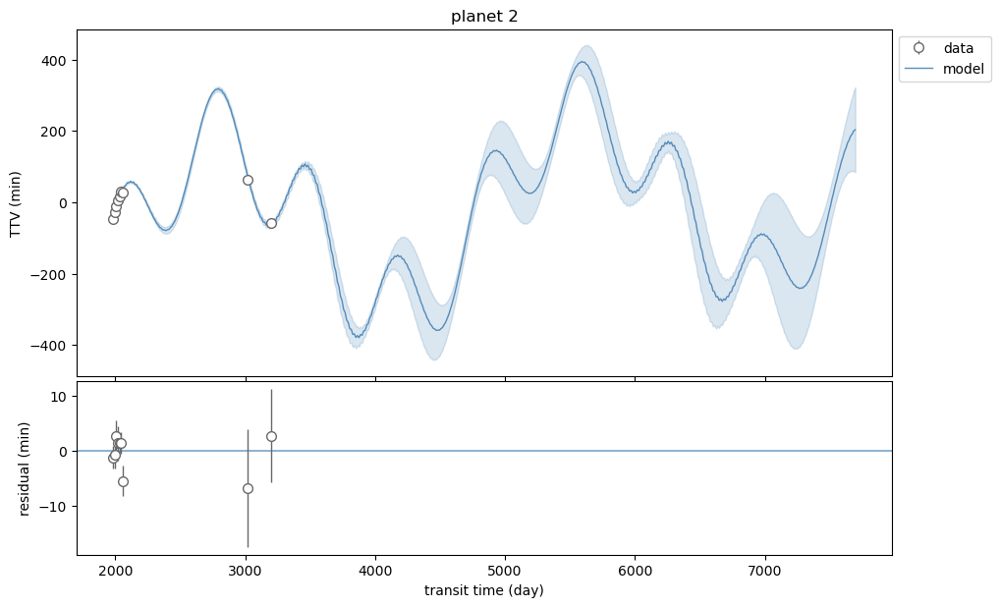

In [9]:
jttv.plot_model(means, tcmodelunclist=stds)

## Trace and corner plots

In [10]:
sample_keys = ["ecosw", "esinw", "pmass", "period", "tic"] # uniform mass prior

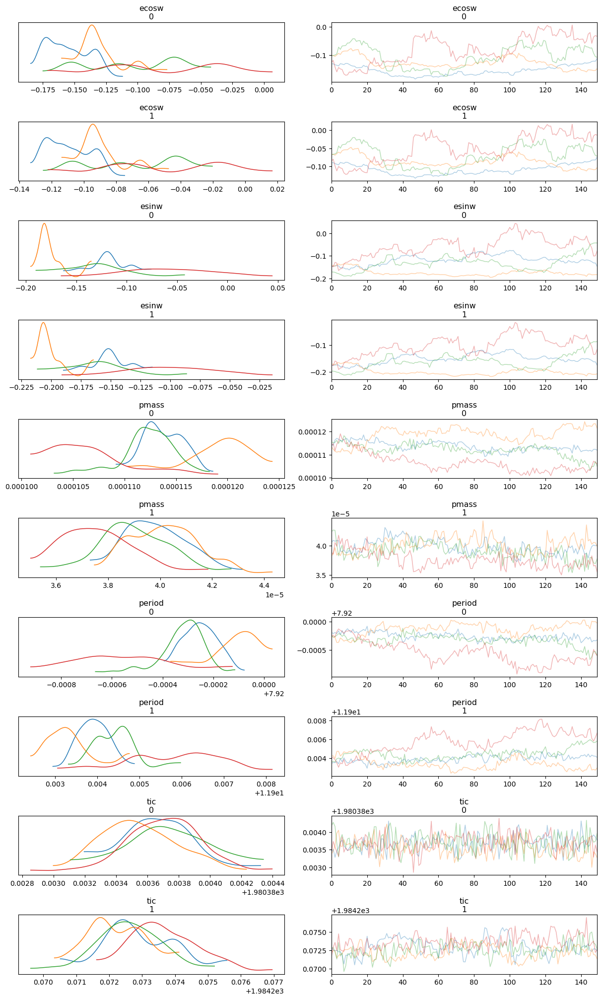

In [11]:
import arviz as az
idata = az.from_numpyro(mcmc)
fig = az.plot_trace(mcmc, var_names=sample_keys, compact=False)
plt.tight_layout(pad=0.2)

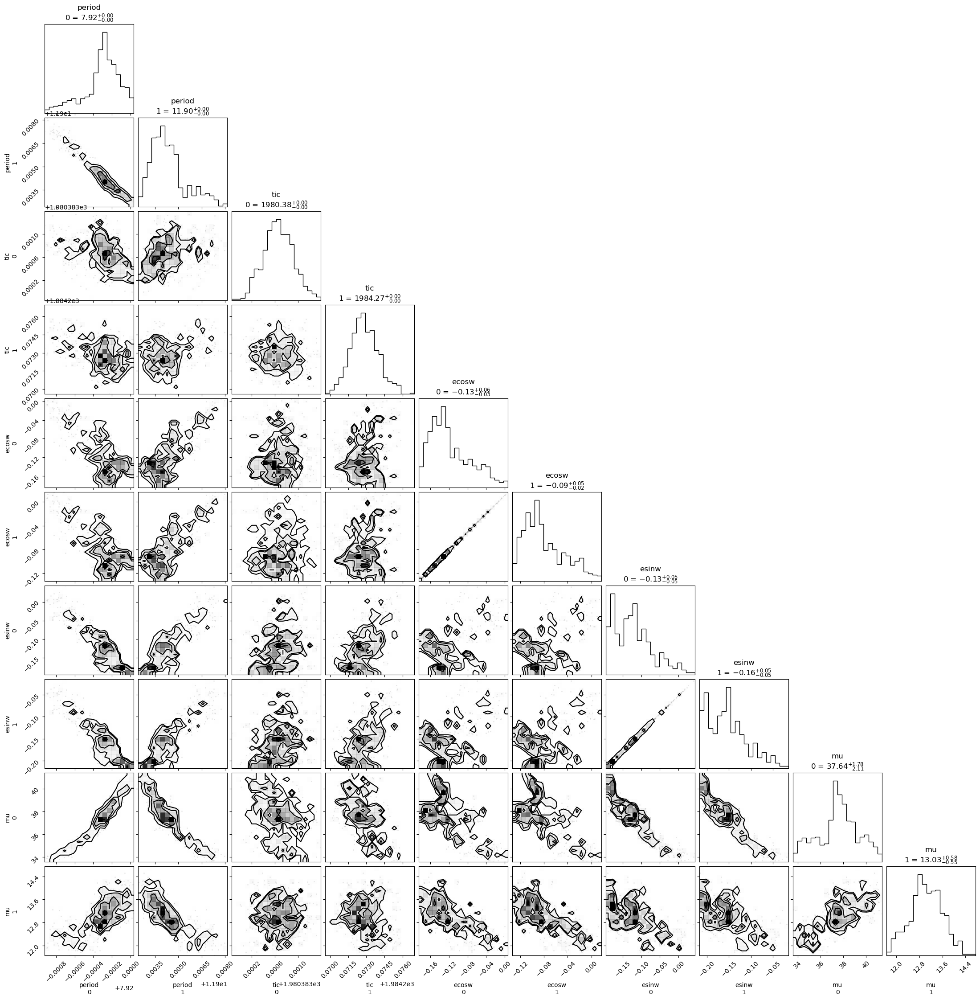

In [12]:
idata.posterior['mu'] = idata.posterior['pmass'] / 3.003e-6
names = ["period", "tic", "ecosw", "esinw", "mu"]
fig = corner.corner(idata, var_names=names, show_titles=True)

In [13]:
az.summary(idata, var_names=["ecc","ecosw_scaled","esinw_scaled", "pmass_scaled","period_scaled","tic_scaled"], round_to=3)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ecc[0],0.173,0.053,0.057,0.244,0.023,0.015,5.744,18.079,1.929
ecc[1],0.175,0.046,0.079,0.239,0.020,0.013,5.610,20.447,2.014
ecosw_scaled[0],0.272,0.089,0.147,0.443,0.032,0.016,7.670,19.440,1.531
ecosw_scaled[1],0.349,0.070,0.246,0.478,0.025,0.012,7.682,17.417,1.530
esinw_scaled[0],0.263,0.105,0.117,0.457,0.044,0.023,5.830,18.914,1.904
esinw_scaled[1],0.197,0.090,0.067,0.359,0.038,0.019,5.780,18.914,1.929
pmass_scaled[0],0.113,0.005,0.102,0.121,0.002,0.001,5.654,21.817,1.987
pmass_scaled[1],0.039,0.002,0.035,0.042,0.001,0.000,9.312,50.822,1.374
period_scaled[0],0.500,0.001,0.497,0.502,0.001,0.000,5.802,26.247,1.903
period_scaled[1],0.506,0.005,0.499,0.516,0.002,0.001,6.044,22.136,1.813


# 500 sample run

In [14]:
working_dir = os.getcwd()
data_dir = os.path.join(working_dir, "data")

file_name = 'jnkep_fit_full.pkl'

file_path = os.path.join(data_dir, file_name)

In [15]:
with open(file_name, "rb") as f:
    mcmc = dill.load(f)

In [16]:
# Posterior samples
posterior_samples = mcmc.get_samples()

# Shape of samples
print({k: v.shape for k, v in posterior_samples.items()})

# Example: summary for 'pmass'
import numpy as np
print("pmass mean:", np.mean(posterior_samples['pmass']))
print("pmass 95% CI:", np.percentile(posterior_samples['pmass'], [2.5, 97.5]))

{'ecc': (2000, 2), 'ecosw': (2000, 2), 'ecosw_scaled': (2000, 2), 'ediff': (2000,), 'esinw': (2000, 2), 'esinw_scaled': (2000, 2), 'period': (2000, 2), 'period_scaled': (2000, 2), 'pmass': (2000, 2), 'pmass_scaled': (2000, 2), 'tcmodel': (2000, 33), 'tic': (2000, 2), 'tic_scaled': (2000, 2)}
pmass mean: 7.09429909446318e-05
pmass 95% CI: [3.55978255e-05 1.12546748e-04]


## Plot models drawn from posteriors

In [17]:
samples = mcmc.get_samples()

In [18]:
means, stds = jttv.sample_means_and_stds(samples, truncate=False)

/opt/homebrew/anaconda3/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:523: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


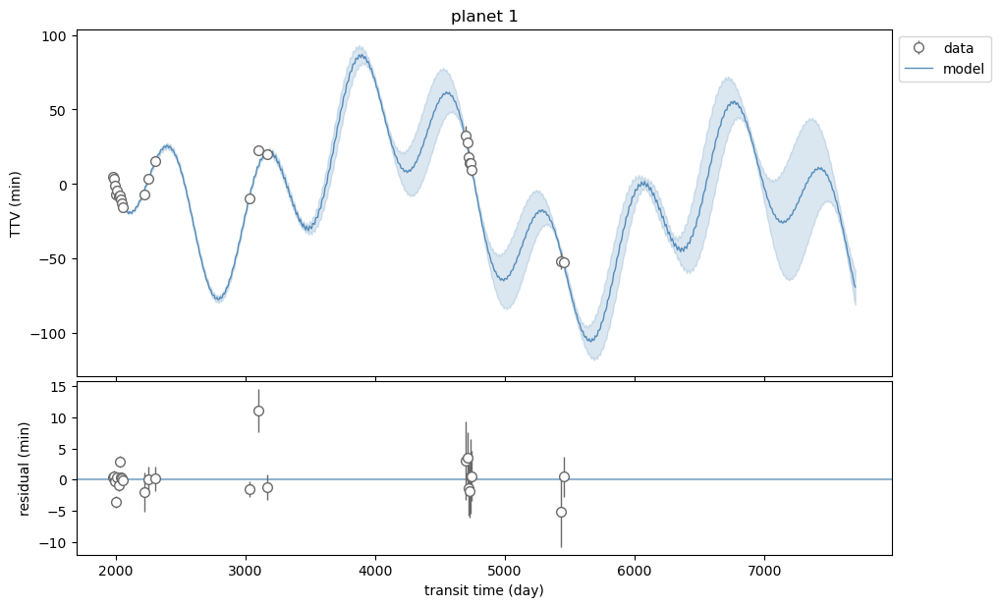

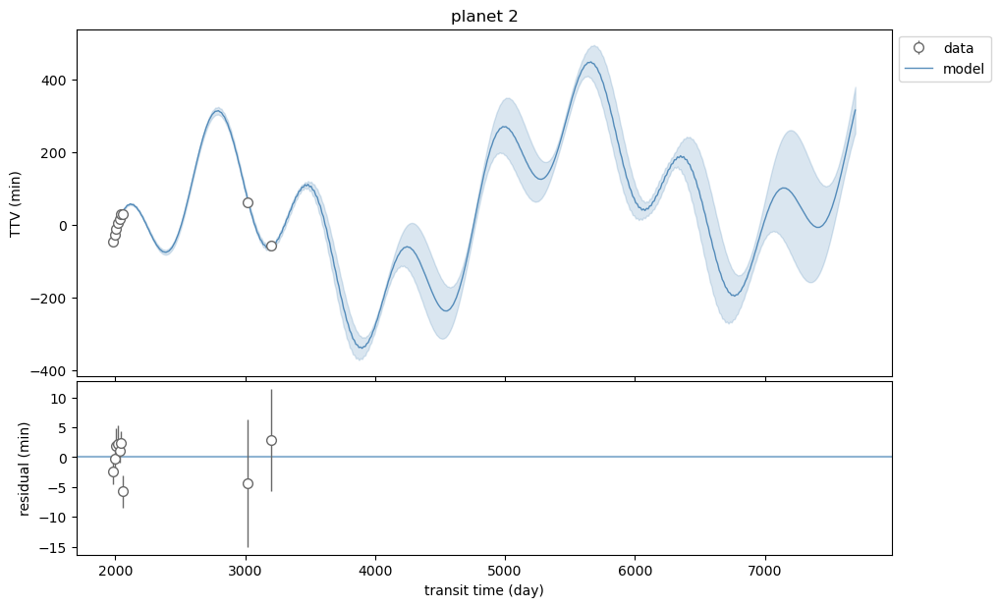

In [19]:
jttv.plot_model(means, tcmodelunclist=stds)

## Trace and corner plots

In [20]:
sample_keys = ["ecosw", "esinw", "pmass", "period", "tic"] # uniform mass prior

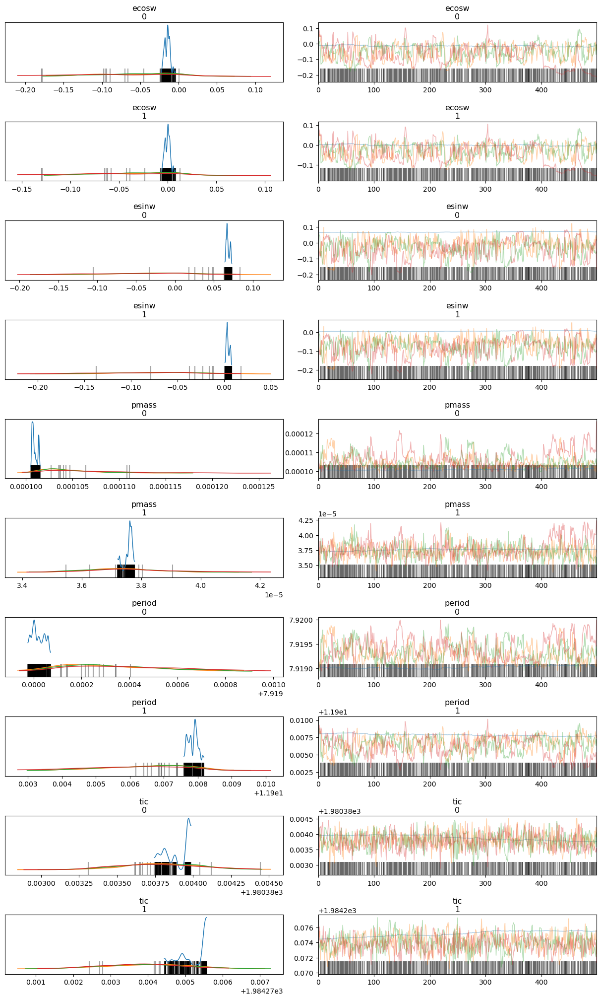

In [21]:
import arviz as az
idata = az.from_numpyro(mcmc)
fig = az.plot_trace(mcmc, var_names=sample_keys, compact=False)
plt.tight_layout(pad=0.2)

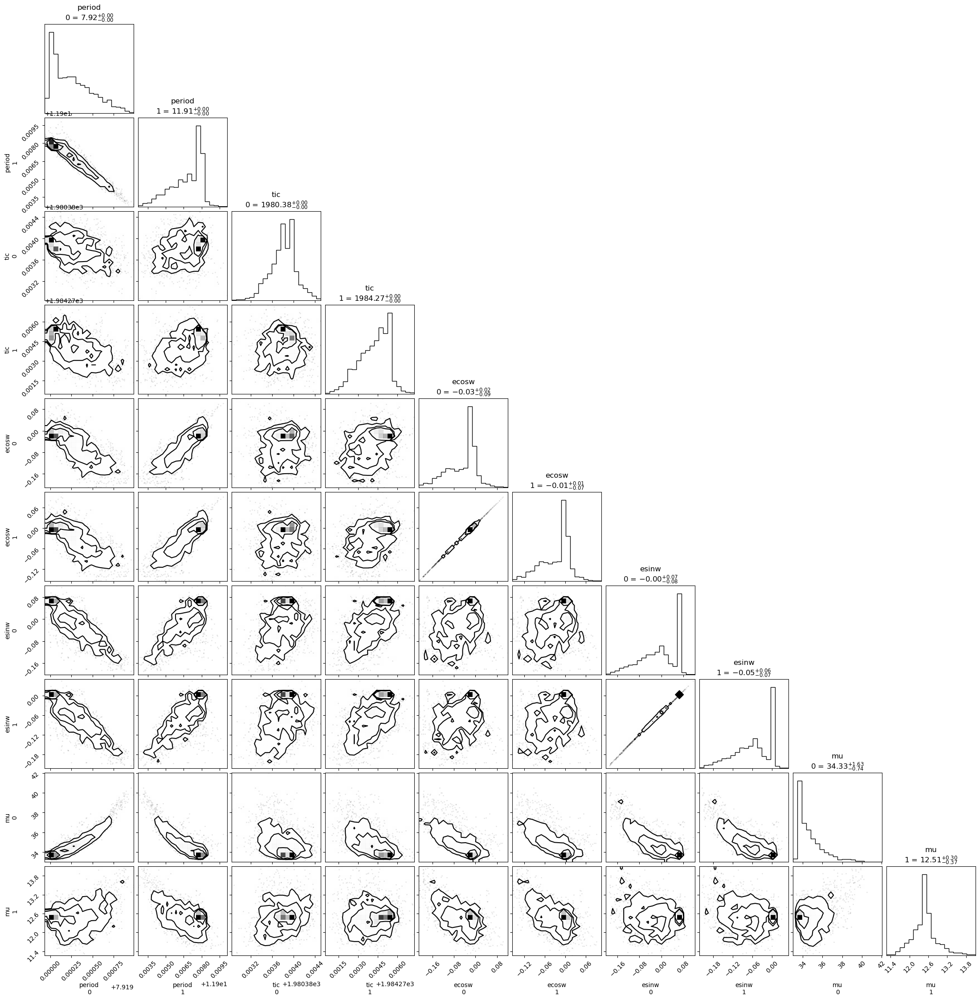

In [22]:
idata.posterior['mu'] = idata.posterior['pmass'] / 3.003e-6
names = ["period", "tic", "ecosw", "esinw", "mu"]
fig = corner.corner(idata, var_names=names, show_titles=True)

In [23]:
az.summary(idata, var_names=["ecc","ecosw_scaled","esinw_scaled", "pmass_scaled","period_scaled","tic_scaled"], round_to=3)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ecc[0],0.088,0.051,0.003,0.188,0.007,0.008,78.962,40.846,1.491
ecc[1],0.076,0.060,0.001,0.179,0.021,0.004,7.234,18.737,1.553
ecosw_scaled[0],0.409,0.113,0.175,0.582,0.023,0.015,38.238,25.582,1.176
ecosw_scaled[1],0.455,0.088,0.255,0.574,0.018,0.012,38.450,25.598,1.183
esinw_scaled[0],0.492,0.140,0.231,0.660,0.047,0.006,8.072,22.261,1.461
esinw_scaled[1],0.389,0.116,0.173,0.527,0.038,0.005,8.092,23.696,1.460
pmass_scaled[0],0.104,0.004,0.100,0.112,0.001,0.000,8.815,54.388,1.396
pmass_scaled[1],0.037,0.001,0.035,0.040,0.000,0.000,170.462,60.732,1.274
period_scaled[0],0.497,0.001,0.495,0.500,0.000,0.000,7.873,21.299,1.473
period_scaled[1],0.516,0.005,0.505,0.523,0.001,0.000,14.039,206.127,1.216


## Removing chain 0 (outlier)

In [24]:
mcmc.print_summary()
posterior = mcmc.get_samples(group_by_chain=True)  # shape: (num_chains, num_samples, ...)
print({k: v.shape for k, v in posterior.items()})


                      mean       std    median      5.0%     95.0%     n_eff     r_hat
 ecosw_scaled[0]      0.41      0.11      0.46      0.20      0.55     15.54      1.11
 ecosw_scaled[1]      0.46      0.09      0.49      0.29      0.56     15.89      1.11
 esinw_scaled[0]      0.49      0.14      0.51      0.27      0.66      4.32      1.39
 esinw_scaled[1]      0.39      0.12      0.40      0.21      0.53      4.36      1.39
period_scaled[0]      0.50      0.00      0.50      0.50      0.50      5.04      1.32
period_scaled[1]      0.52      0.01      0.52      0.51      0.52      7.59      1.20
 pmass_scaled[0]      0.10      0.00      0.10      0.10      0.11      7.23      1.21
 pmass_scaled[1]      0.04      0.00      0.04      0.04      0.04    127.52      1.02
   tic_scaled[0]      0.50      0.00      0.50      0.49      0.50    174.64      1.04
   tic_scaled[1]      0.52      0.01      0.52      0.50      0.53      7.73      1.18

Number of divergences: 369
{'ecc': (4, 50

In [25]:
good_chain_idxs = [1, 2, 3]

samples_filtered = {
    k: v[good_chain_idxs, ...] for k, v in posterior.items()
}
# print(samples_filtered)
samples_flat = {
    k: v.reshape(-1, *v.shape[2:]) for k, v in samples_filtered.items()
}


In [26]:
means, stds = jttv.sample_means_and_stds(samples_flat, truncate=False)

/opt/homebrew/anaconda3/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:523: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


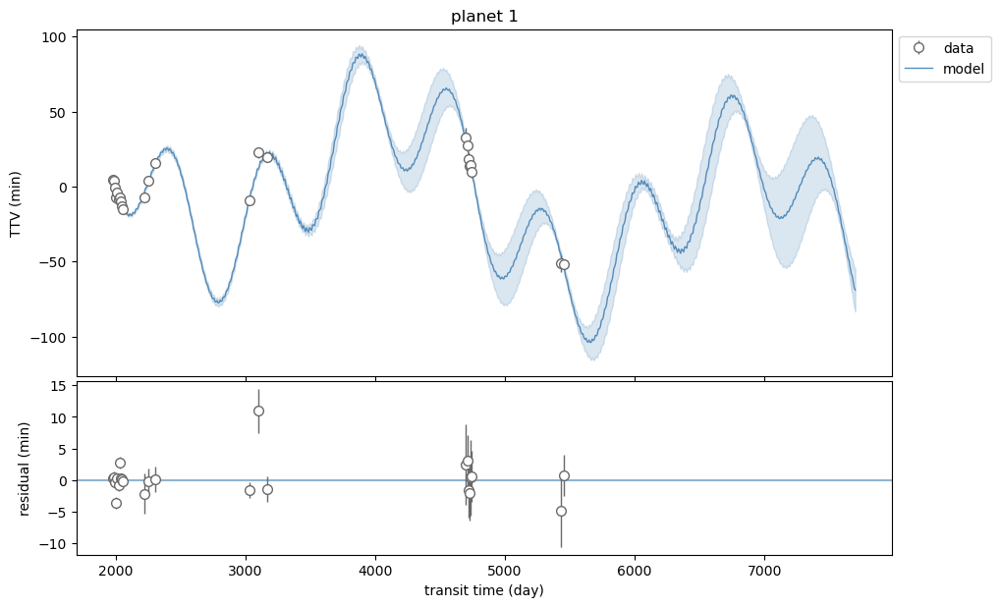

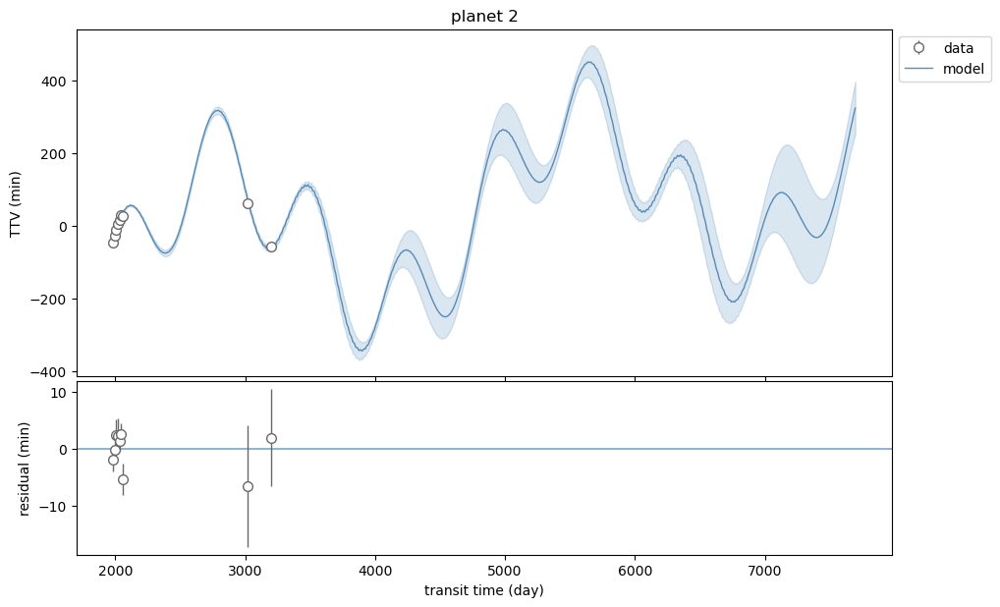

In [27]:
jttv.plot_model(means, tcmodelunclist=stds)

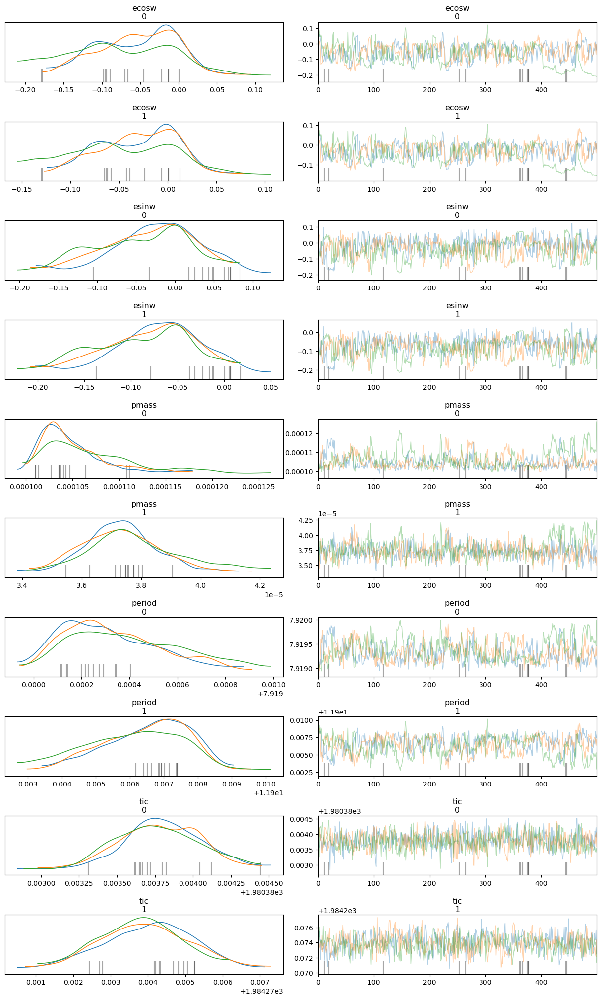

In [28]:
### remove outlier
az.summary(idata, var_names=sample_keys)
# Drop chain 1 from all groups that have 'chain' as a dimension
idata_filtered = idata.sel(chain=[c for c in idata.posterior.chain.values if c != 0])
az.plot_trace(idata_filtered, var_names=sample_keys, compact=False)
plt.tight_layout(pad=0.2)

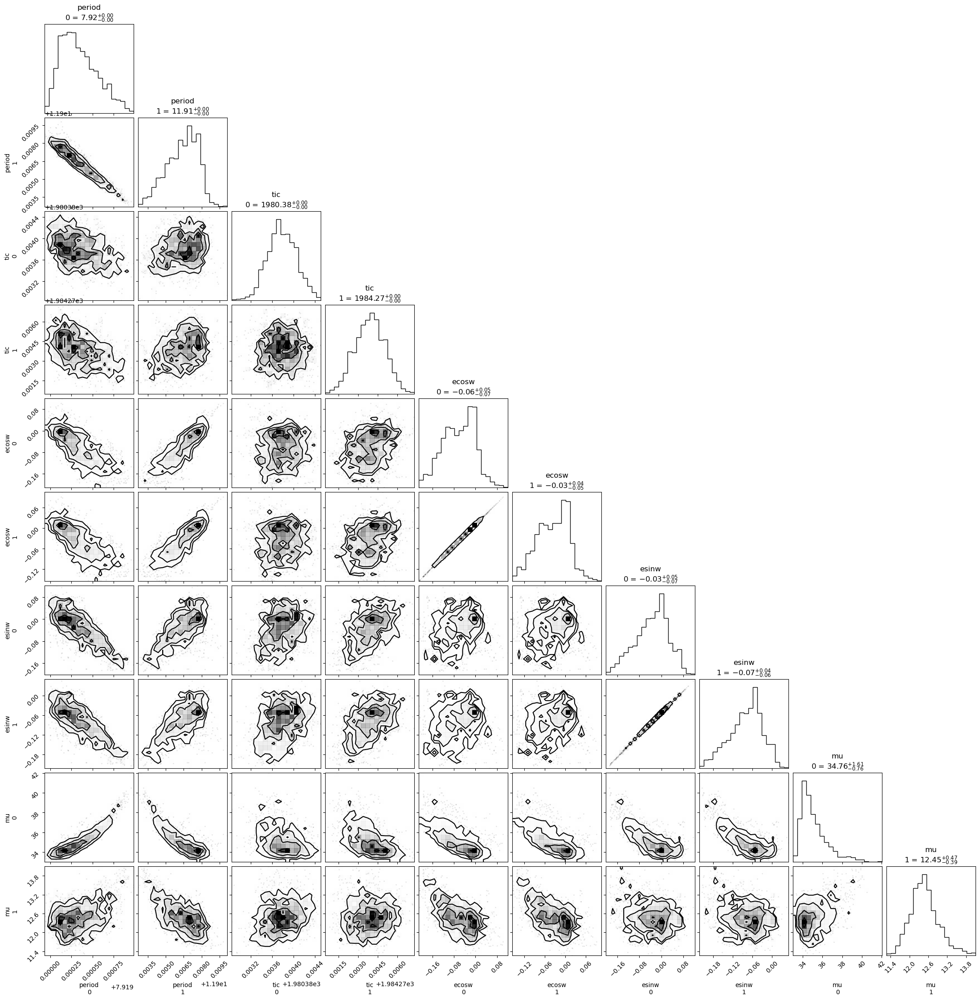

In [29]:
idata_filtered.posterior['mu'] = idata_filtered.posterior['pmass'] / 3.003e-6
names = ["period", "tic", "ecosw", "esinw", "mu"]
fig = corner.corner(idata_filtered, var_names=names, show_titles=True)

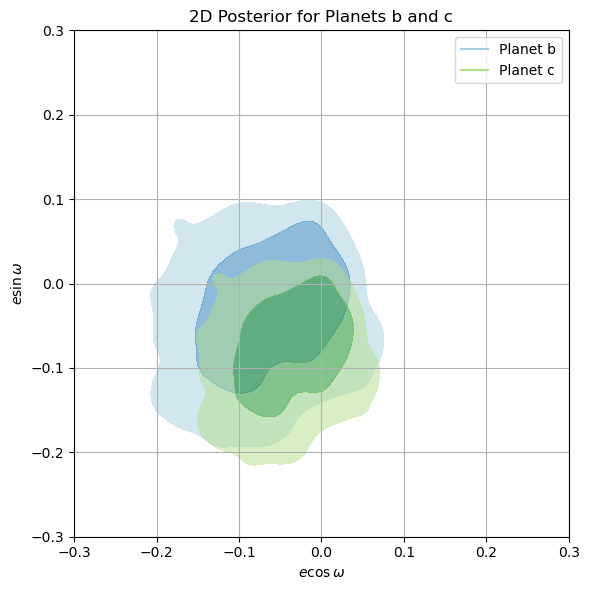

In [30]:
### 2D posterior for ecosw and esinw 
ecosw_b = samples_flat["ecosw"][:, 0]
esinw_b = samples_flat["esinw"][:, 0]

ecosw_c = samples_flat["ecosw"][:, 1]
esinw_c = samples_flat["esinw"][:, 1]

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde


def compute_kde_contour_levels(x, y, gridsize=100):
    data = np.vstack([x, y])
    kde = gaussian_kde(data)
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    X, Y = np.mgrid[x_min:x_max:gridsize*1j, y_min:y_max:gridsize*1j]
    positions = np.vstack([X.ravel(), Y.ravel()])
    Z = np.reshape(kde(positions).T, X.shape)
    return X, Y, Z, kde

def get_sigma_contour_levels(Z):
    Z_flat = Z.flatten()
    Z_sorted = np.sort(Z_flat)[::-1]
    cumsum = np.cumsum(Z_sorted)
    cumsum /= cumsum[-1]
    levels = []
    for sigma in [0.683, 0.954]:
        idx = np.searchsorted(cumsum, sigma)
        levels.append(Z_sorted[idx])
    return sorted(levels)  # ensures ascending order

# Compute KDEs
Xb, Yb, Zb, kde_b = compute_kde_contour_levels(ecosw_b, esinw_b)
Xc, Yc, Zc, kde_c = compute_kde_contour_levels(ecosw_c, esinw_c)

# Get contour levels
levels_b = get_sigma_contour_levels(Zb)
levels_c = get_sigma_contour_levels(Zc)

# Plot
fig, ax = plt.subplots(figsize=(6, 6))

# Filled contours for planet b (blue shades)
ax.contourf(Xb, Yb, Zb, levels=levels_b + [Zb.max()], colors=['#a6cee3', '#1f78b4'], alpha=0.5)

# Filled contours for planet c (green shades)
ax.contourf(Xc, Yc, Zc, levels=levels_c + [Zc.max()], colors=['#b2df8a', '#33a02c'], alpha=0.5)

# Labels and legend
ax.set_xlabel(r"$e \cos\omega$")
ax.set_ylabel(r"$e \sin\omega$")
ax.set_title("2D Posterior for Planets b and c")
blue_patch = plt.Line2D([], [], color='#a6cee3', label='Planet b')
red_patch = plt.Line2D([], [], color='#b2df8a', label='Planet c')
ax.legend(handles=[blue_patch, red_patch])

plt.grid(True)
plt.xlim(-0.30,0.30)
plt.ylim(-0.30,0.30)
plt.tight_layout()
plt.show()

In [31]:
az.summary(idata_filtered, var_names=["ecc","ecosw_scaled","esinw_scaled", "pmass_scaled","period_scaled","tic_scaled"], round_to=3)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ecc[0],0.094,0.058,0.000,0.193,0.008,0.005,59.876,47.760,1.041
ecc[1],0.099,0.051,0.022,0.211,0.006,0.002,79.764,238.948,1.046
ecosw_scaled[0],0.385,0.121,0.113,0.555,0.015,0.012,62.093,17.400,1.034
ecosw_scaled[1],0.437,0.094,0.223,0.568,0.012,0.009,62.002,17.428,1.035
esinw_scaled[0],0.440,0.123,0.210,0.657,0.010,0.005,161.616,234.056,1.034
esinw_scaled[1],0.346,0.102,0.151,0.524,0.008,0.004,162.583,239.255,1.034
pmass_scaled[0],0.105,0.004,0.100,0.113,0.001,0.000,82.815,193.721,1.032
pmass_scaled[1],0.037,0.001,0.035,0.040,0.000,0.000,151.533,65.912,1.019
period_scaled[0],0.497,0.001,0.495,0.500,0.000,0.000,114.673,188.810,1.027
period_scaled[1],0.515,0.005,0.505,0.524,0.001,0.000,130.079,183.445,1.020


## Only chain 0 (outlier)

In [32]:
posterior_outlier = mcmc.get_samples(group_by_chain=True)  # shape: (num_chains, num_samples, ...)
print({k: v.shape for k, v in posterior_outlier.items()})

{'ecc': (4, 500, 2), 'ecosw': (4, 500, 2), 'ecosw_scaled': (4, 500, 2), 'ediff': (4, 500), 'esinw': (4, 500, 2), 'esinw_scaled': (4, 500, 2), 'period': (4, 500, 2), 'period_scaled': (4, 500, 2), 'pmass': (4, 500, 2), 'pmass_scaled': (4, 500, 2), 'tcmodel': (4, 500, 33), 'tic': (4, 500, 2), 'tic_scaled': (4, 500, 2)}


In [33]:
good_chain_idxs = [0]

samples_filtered_outlier = {
    k: v[good_chain_idxs, ...] for k, v in posterior_outlier.items()
}
# print(samples_filtered)
samples_flat_outlier = {
    k: v.reshape(-1, *v.shape[2:]) for k, v in samples_filtered_outlier.items()
}


In [34]:
means, stds = jttv.sample_means_and_stds(samples_flat_outlier, truncate=False)

/opt/homebrew/anaconda3/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:523: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


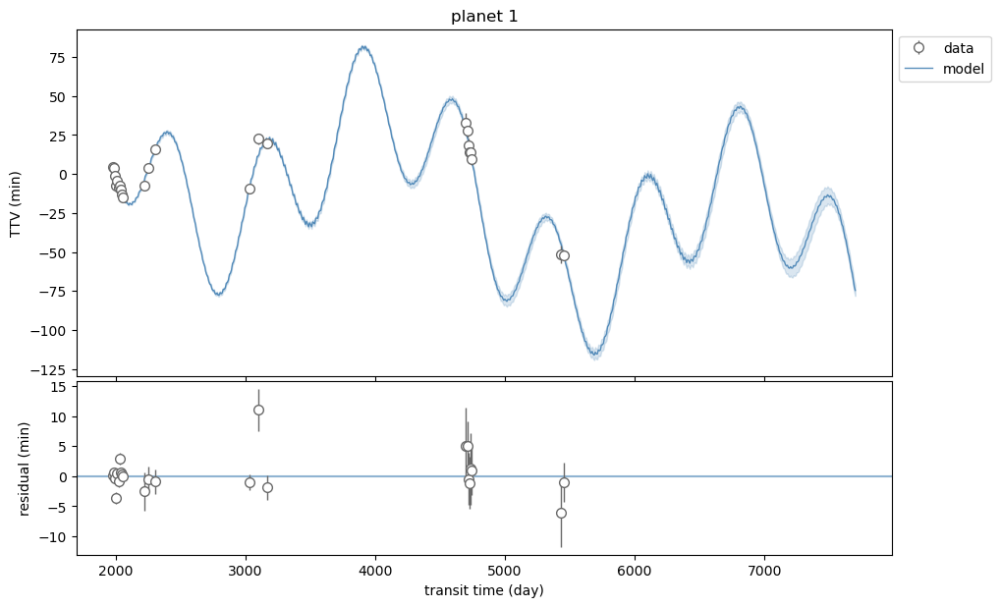

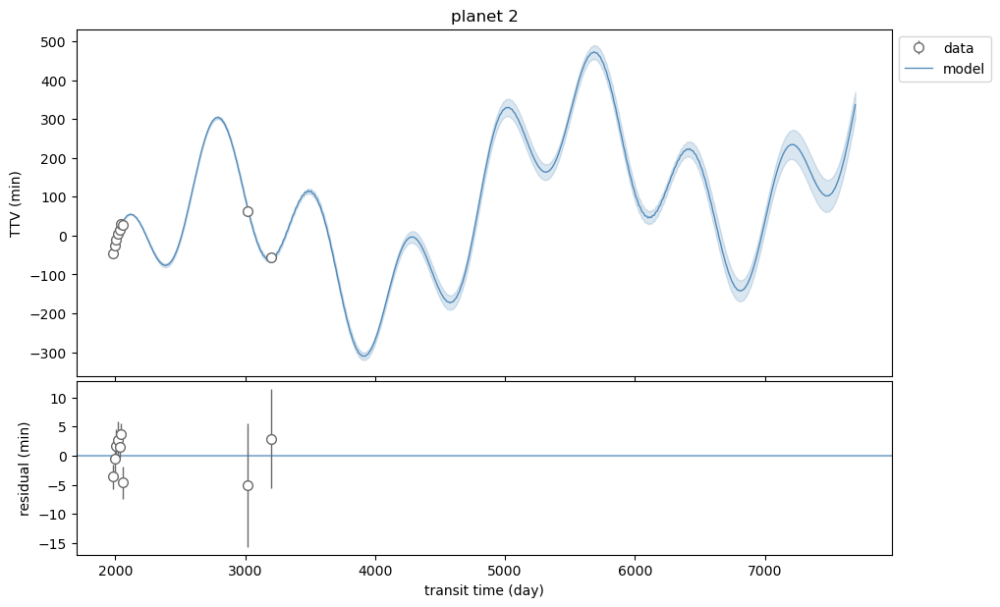

In [35]:
jttv.plot_model(means, tcmodelunclist=stds)

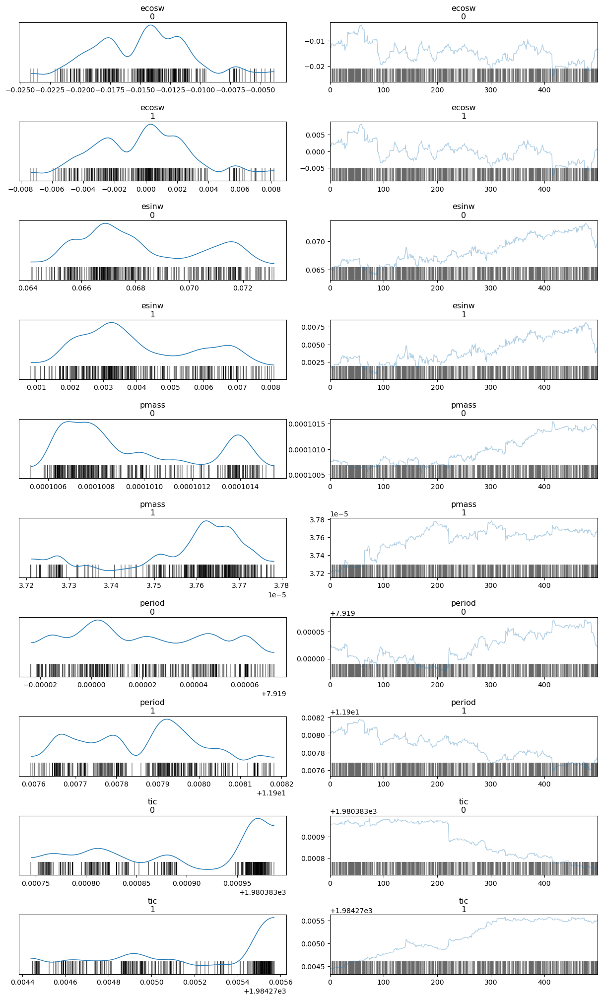

In [36]:
### keep outlier
# Drop chain 0 from all groups that have 'chain' as a dimension
idata_filtered_outlier = idata.sel(chain=[c for c in idata.posterior.chain.values if c == 0])
az.plot_trace(idata_filtered_outlier, var_names=sample_keys, compact=False)
plt.tight_layout(pad=0.2)

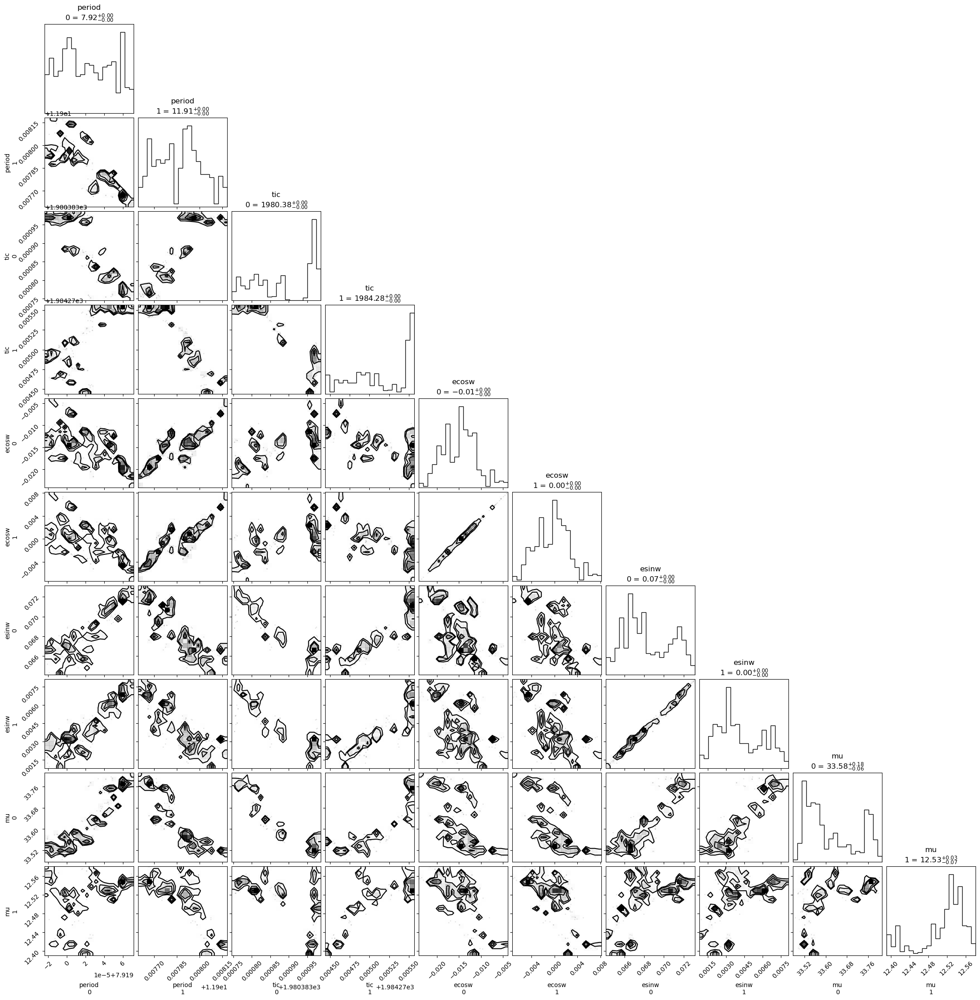

In [37]:
idata_filtered_outlier.posterior['mu'] = idata_filtered_outlier.posterior['pmass'] / 3.003e-6
names = ["period", "tic", "ecosw", "esinw", "mu"]
fig = corner.corner(idata_filtered_outlier, var_names=names, show_titles=True)

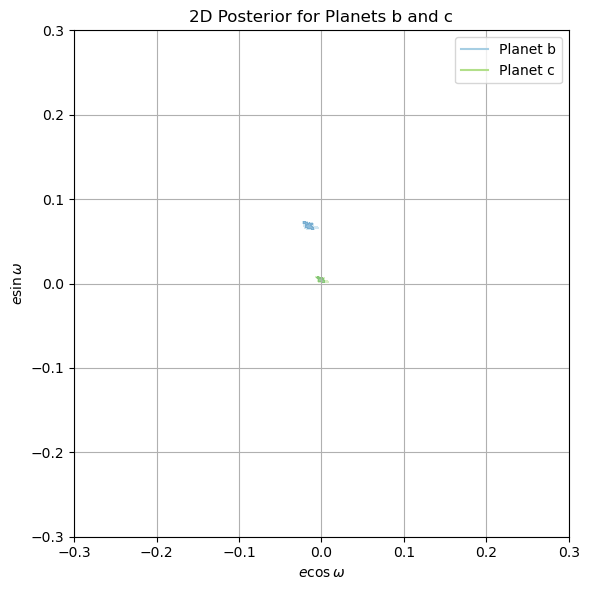

In [38]:
### 2D posterior for ecosw and esinw 
ecosw_b = samples_flat_outlier["ecosw"][:, 0]
esinw_b = samples_flat_outlier["esinw"][:, 0]

ecosw_c = samples_flat_outlier["ecosw"][:, 1]
esinw_c = samples_flat_outlier["esinw"][:, 1]

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde


def compute_kde_contour_levels(x, y, gridsize=100):
    data = np.vstack([x, y])
    kde = gaussian_kde(data)
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    X, Y = np.mgrid[x_min:x_max:gridsize*1j, y_min:y_max:gridsize*1j]
    positions = np.vstack([X.ravel(), Y.ravel()])
    Z = np.reshape(kde(positions).T, X.shape)
    return X, Y, Z, kde

def get_sigma_contour_levels(Z):
    Z_flat = Z.flatten()
    Z_sorted = np.sort(Z_flat)[::-1]
    cumsum = np.cumsum(Z_sorted)
    cumsum /= cumsum[-1]
    levels = []
    for sigma in [0.683, 0.954]:
        idx = np.searchsorted(cumsum, sigma)
        levels.append(Z_sorted[idx])
    return sorted(levels)  # ensures ascending order

# Compute KDEs
Xb, Yb, Zb, kde_b = compute_kde_contour_levels(ecosw_b, esinw_b)
Xc, Yc, Zc, kde_c = compute_kde_contour_levels(ecosw_c, esinw_c)

# Get contour levels
levels_b = get_sigma_contour_levels(Zb)
levels_c = get_sigma_contour_levels(Zc)

# Plot
fig, ax = plt.subplots(figsize=(6, 6))

# Filled contours for planet b (blue shades)
ax.contourf(Xb, Yb, Zb, levels=levels_b + [Zb.max()], colors=['#a6cee3', '#1f78b4'], alpha=0.5)

# Filled contours for planet c (green shades)
ax.contourf(Xc, Yc, Zc, levels=levels_c + [Zc.max()], colors=['#b2df8a', '#33a02c'], alpha=0.5)

# Labels and legend
ax.set_xlabel(r"$e \cos\omega$")
ax.set_ylabel(r"$e \sin\omega$")
ax.set_title("2D Posterior for Planets b and c")
blue_patch = plt.Line2D([], [], color='#a6cee3', label='Planet b')
red_patch = plt.Line2D([], [], color='#b2df8a', label='Planet c')
ax.legend(handles=[blue_patch, red_patch])

plt.grid(True)
plt.xlim(-0.30,0.30)
plt.ylim(-0.30,0.30)
plt.tight_layout()
plt.show()

In [39]:
az.summary(idata_filtered_outlier, var_names=["ecc","ecosw_scaled","esinw_scaled", "pmass_scaled","period_scaled","tic_scaled"], round_to=3)


arviz - WARNING - Shape validation failed: input_shape: (1, 500), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ecc[0],0.070,0.003,0.065,0.075,0.002,0.001,1.355,14.969,NaN
ecc[1],0.005,0.002,0.002,0.008,0.001,0.000,1.872,17.317,NaN
ecosw_scaled[0],0.480,0.008,0.467,0.496,0.004,0.001,3.385,20.642,NaN
ecosw_scaled[1],0.510,0.006,0.499,0.522,0.004,0.001,2.773,20.642,NaN
esinw_scaled[0],0.650,0.005,0.643,0.658,0.004,0.001,1.368,11.627,NaN
esinw_scaled[1],0.519,0.004,0.514,0.526,0.003,0.001,1.384,12.301,NaN
pmass_scaled[0],0.101,0.000,0.101,0.101,0.000,0.000,1.371,54.981,NaN
pmass_scaled[1],0.037,0.000,0.037,0.038,0.000,0.000,2.974,11.049,NaN
period_scaled[0],0.495,0.000,0.495,0.496,0.000,0.000,1.409,13.599,NaN
period_scaled[1],0.521,0.001,0.520,0.522,0.001,0.000,1.379,24.166,NaN


# transit times

In [40]:
file_path = 'ttv_results.txt'  # Replace with your file path
with open(file_path, 'r') as file:
    # Read the entire content of the file
    content = file.read()
    # Print the content
    print(content)

Planet_num Index Tc Tc_err OMC Source Instrument
1 -6 1980.38403000 0.00044000 0.01493000 Narita2015 K2
1 -5 1988.30421000 0.00061000 0.01291000 Narita2015 K2
1 -4 1996.22197000 0.00048000 0.00847000 Narita2015 K2
1 -3 2004.13851000 0.00066000 0.00281000 Narita2015 K2
1 -2 2012.06161000 0.00042000 0.00371000 Narita2015 K2
1 -1 2019.97953000 0.00066000 -0.00057000 Narita2015 K2
1 0 2027.90124000 0.00068000 -0.00106000 Narita2015 K2
1 1 2035.82024000 0.00041000 -0.00426000 Narita2015 K2
1 2 2043.73925000 0.00054000 -0.00745000 Narita2015 K2
1 3 2051.65861000 0.00059000 -0.01029000 Narita2015 K2
1 24 2218.00410000 0.00220000 -0.03100000 Petigura2020 FLWO
1 28 2249.69550000 0.00140000 -0.02840000 Petigura2020 TRAPPIST
1 35 2305.15050000 0.00140000 -0.02880000 Petigura2020 MuSCAT
1 127 3033.86040000 0.00090000 -0.16130000 Petigura2020 Spitzer
1 135 3097.25020000 0.00240000 -0.14910000 Petigura2020 LCO
1 144 3168.53680000 0.00140000 -0.16230000 Petigura2020 Spitzer
1 337 4697.28902908 0.0043

In [41]:
file_path = 'ttv_results.txt'  # Path to your file

data = []

with open(file_path, 'r') as file:
    lines = file.readlines()
    header = lines[0].strip()  # Save header
    for line in lines[1:]:  # Skip header
        parts = line.strip().split()
        if len(parts) >= 7:
            try:
                tc_value = float(parts[2])  # Tc is the 3rd column (index 2)
                data.append((tc_value, line.strip()))
            except ValueError:
                continue  # Skip lines where Tc isn't a float

# Sort by Tc
data.sort(key=lambda x: x[0])

# Print header and sorted data
print(header)
for _, line in data:
    print(line)

Planet_num Index Tc Tc_err OMC Source Instrument
1 -6 1980.38403000 0.00044000 0.01493000 Narita2015 K2
2 -3 1984.27227000 0.00144000 -0.03053000 Narita2015 K2
1 -5 1988.30421000 0.00061000 0.01291000 Narita2015 K2
2 -2 1996.18406000 0.00170000 -0.01804000 Narita2015 K2
1 -4 1996.22197000 0.00048000 0.00847000 Narita2015 K2
1 -3 2004.13851000 0.00066000 0.00281000 Narita2015 K2
2 -1 2008.09346000 0.00198000 -0.00794000 Narita2015 K2
1 -2 2012.06161000 0.00042000 0.00371000 Narita2015 K2
1 -1 2019.97953000 0.00066000 -0.00057000 Narita2015 K2
2 0 2020.00224000 0.00214000 0.00154000 Narita2015 K2
1 0 2027.90124000 0.00068000 -0.00106000 Narita2015 K2
2 1 2031.90713000 0.00127000 0.00713000 Narita2015 K2
1 1 2035.82024000 0.00041000 -0.00426000 Narita2015 K2
1 2 2043.73925000 0.00054000 -0.00745000 Narita2015 K2
2 2 2043.81473000 0.00135000 0.01543000 Narita2015 K2
1 3 2051.65861000 0.00059000 -0.01029000 Narita2015 K2
2 3 2055.71247000 0.00191000 0.01387000 Narita2015 K2
1 24 2218.004100

In [76]:
file_path = 'ttv_results.txt'  # Path to your file

data = []

with open(file_path, 'r') as file:
    lines = file.readlines()
    header = lines[0].strip()  # Save header
    for line in lines[1:]:  # Skip header
        parts = line.strip().split()
        if len(parts) >= 7:
            try:
                tc_value = float(parts[2])  # Tc is the 3rd column (index 2)
                tc_err_value = float(parts[3])  # Tc_err is the 4th column (index 3)
                # Round to 4 decimal places
                tc_rounded = round(tc_value, 4)
                tc_err_rounded = round(tc_err_value, 4)
                # Replace original values with rounded values in the line
                parts[2] = f"{tc_rounded:.4f}"
                parts[3] = f"{tc_err_rounded:.4f}"
                updated_line = " ".join(parts)
                data.append((tc_rounded, updated_line))
            except (ValueError, IndexError):
                continue  # Skip lines where Tc or Tc_err aren't floats or the line doesn't have enough columns

# Sort by Tc
data.sort(key=lambda x: x[0])

# Print header and sorted data
print(header)
for _, line in data:
    print(line)


Planet_num Index Tc Tc_err OMC Source Instrument
1 -6 1980.3840 0.0004 0.01493000 Narita2015 K2
2 -3 1984.2723 0.0014 -0.03053000 Narita2015 K2
1 -5 1988.3042 0.0006 0.01291000 Narita2015 K2
2 -2 1996.1841 0.0017 -0.01804000 Narita2015 K2
1 -4 1996.2220 0.0005 0.00847000 Narita2015 K2
1 -3 2004.1385 0.0007 0.00281000 Narita2015 K2
2 -1 2008.0935 0.0020 -0.00794000 Narita2015 K2
1 -2 2012.0616 0.0004 0.00371000 Narita2015 K2
1 -1 2019.9795 0.0007 -0.00057000 Narita2015 K2
2 0 2020.0022 0.0021 0.00154000 Narita2015 K2
1 0 2027.9012 0.0007 -0.00106000 Narita2015 K2
2 1 2031.9071 0.0013 0.00713000 Narita2015 K2
1 1 2035.8202 0.0004 -0.00426000 Narita2015 K2
1 2 2043.7393 0.0005 -0.00745000 Narita2015 K2
2 2 2043.8147 0.0014 0.01543000 Narita2015 K2
1 3 2051.6586 0.0006 -0.01029000 Narita2015 K2
2 3 2055.7125 0.0019 0.01387000 Narita2015 K2
1 24 2218.0041 0.0022 -0.03100000 Petigura2020 FLWO
1 28 2249.6955 0.0014 -0.02840000 Petigura2020 TRAPPIST
1 35 2305.1505 0.0014 -0.02880000 Petigura20

# 1000 burn in 1000 samples

In [64]:
file_name_1000 = 'jnkep_fit_k2-19_nburn-1000_nsteps-1000.pkl'
working_dir = os.getcwd()
data_dir = os.path.join(working_dir, "data")

file_path_1000 = os.path.join(data_dir, file_name_1000)

In [65]:
with open(file_name_1000, "rb") as f:
    mcmc_1000 = dill.load(f)
mcmc_1000.print_summary()
print(mcmc_1000)


                      mean       std    median      5.0%     95.0%     n_eff     r_hat
 ecosw_scaled[0]      0.38      0.12      0.37      0.19      0.56    225.21      1.02
 ecosw_scaled[1]      0.43      0.09      0.43      0.27      0.57    224.23      1.02
 esinw_scaled[0]      0.38      0.15      0.39      0.10      0.59     20.20      1.14
 esinw_scaled[1]      0.30      0.12      0.31      0.06      0.47     20.58      1.14
period_scaled[0]      0.50      0.00      0.50      0.50      0.50     31.43      1.07
period_scaled[1]      0.51      0.01      0.51      0.50      0.52    101.42      1.05
 pmass_scaled[0]      0.11      0.00      0.11      0.10      0.11     57.46      1.07
 pmass_scaled[1]      0.04      0.00      0.04      0.04      0.04    283.07      1.02
   tic_scaled[0]      0.50      0.00      0.50      0.49      0.50    192.45      1.03
   tic_scaled[1]      0.51      0.01      0.51      0.49      0.53    319.31      1.02

Number of divergences: 123


In [66]:
print(mcmc_1000.__dict__.keys())

dict_keys(['sampler', '_sample_field', '_default_fields', 'num_warmup', 'num_samples', 'num_chains', 'thinning', 'postprocess_fn', 'chain_method', 'progress_bar', '_jit_model_args', '_states', '_states_flat', '_last_state', '_warmup_state', '_init_state_cache', '_cache', '_collection_params', '_args', '_kwargs'])


In [45]:
# Posterior samples
posterior_samples_1000 = mcmc_1000.get_samples()

# Shape of samples
print({k: v.shape for k, v in posterior_samples_1000.items()})

# Example: summary for 'pmass'
import numpy as np
print("pmass mean:", np.mean(posterior_samples_1000['pmass']))
print("pmass 95% CI:", np.percentile(posterior_samples_1000['pmass'], [2.5, 97.5]))

{'ecc': (4000, 2), 'ecosw': (4000, 2), 'ecosw_scaled': (4000, 2), 'ediff': (4000,), 'esinw': (4000, 2), 'esinw_scaled': (4000, 2), 'period': (4000, 2), 'period_scaled': (4000, 2), 'pmass': (4000, 2), 'pmass_scaled': (4000, 2), 'tcmodel': (4000, 33), 'tic': (4000, 2), 'tic_scaled': (4000, 2)}
pmass mean: 7.241239076474654e-05
pmass 95% CI: [3.53547502e-05 1.17267706e-04]


## Plot models drawn from posteriors 

In [67]:
samples_1000 = mcmc_1000.get_samples()

In [68]:
means, stds = jttv.sample_means_and_stds(samples, truncate=False)

<Figure size 1920x1440 with 0 Axes>

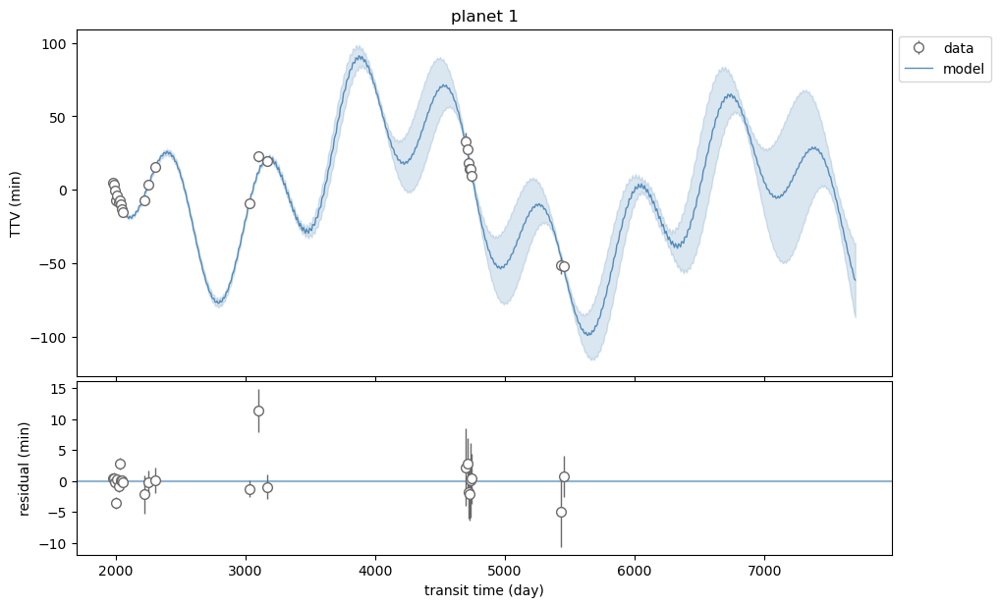

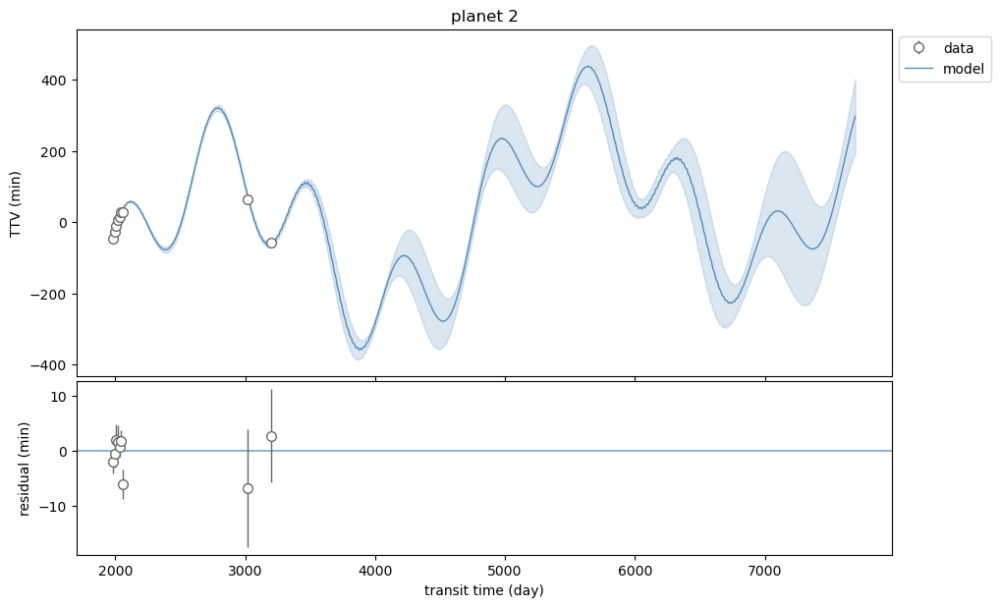

<Figure size 1920x1440 with 0 Axes>

In [69]:
jttv.plot_model(means, tcmodelunclist=stds)
plt.figure(dpi=300) 

## Trace and corner plots 

In [70]:
sample_keys = ["ecosw", "esinw", "pmass", "period", "tic"] # uniform mass prior

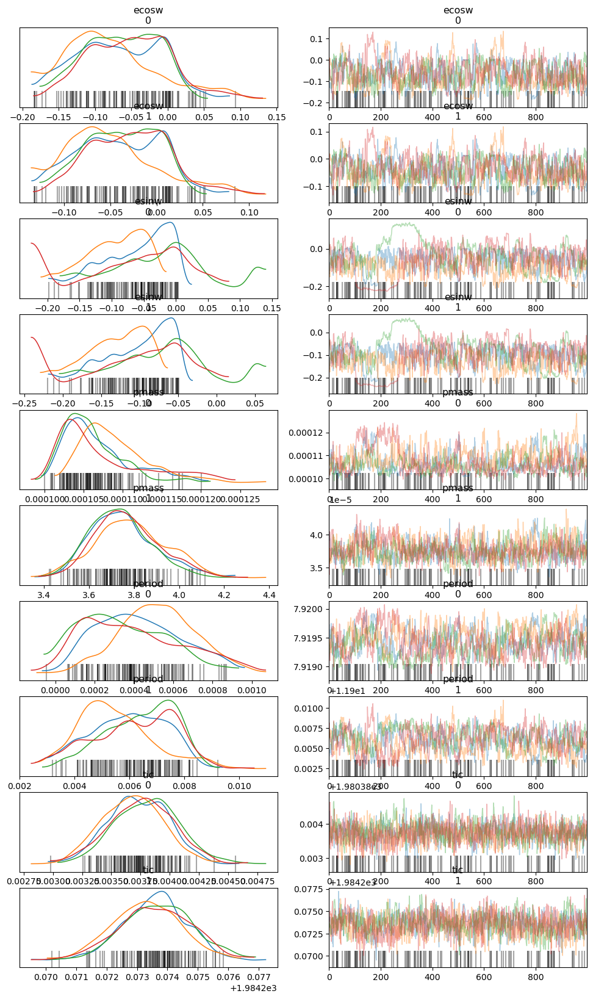

<Figure size 1920x1440 with 0 Axes>

In [71]:
import arviz as az
idata_1000 = az.from_numpyro(mcmc_1000)
fig = az.plot_trace(mcmc_1000, var_names=sample_keys, compact=False)
plt.figure(dpi=300) 
plt.tight_layout(pad=0.2)

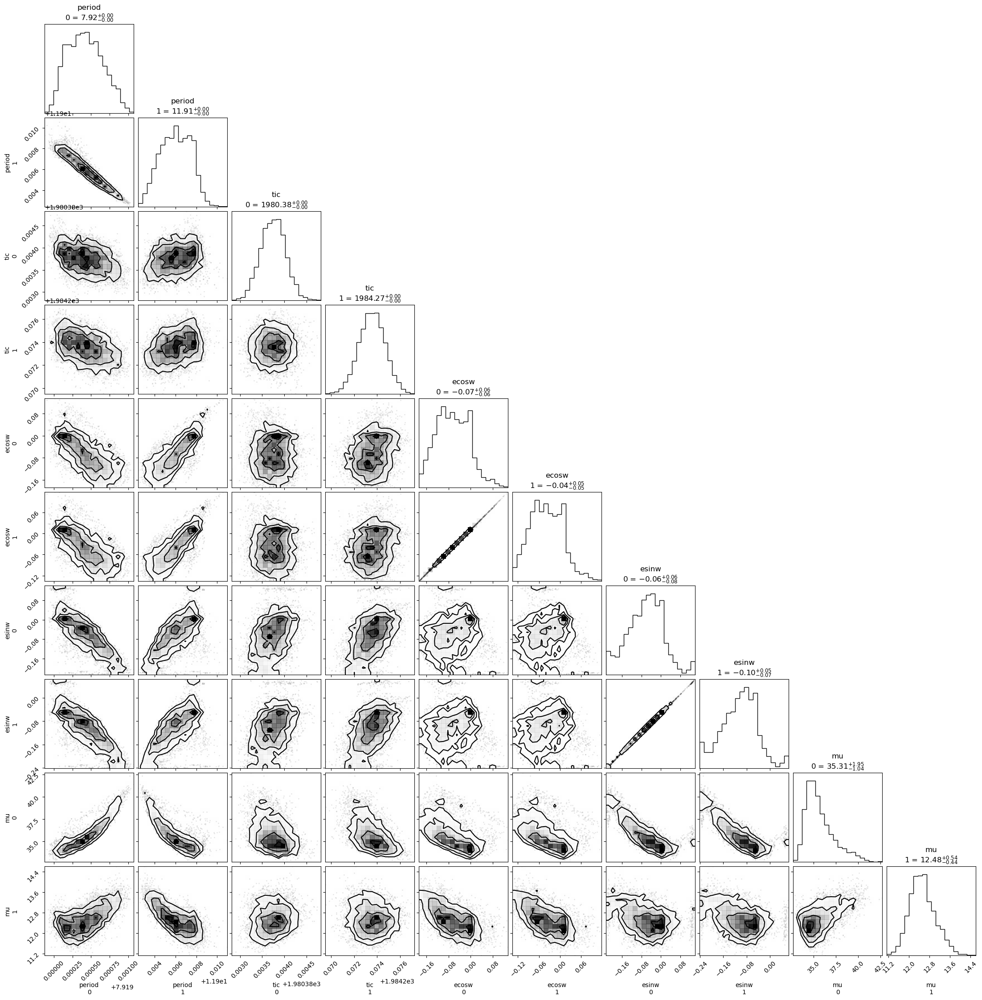

In [72]:
idata_1000.posterior['mu'] = idata_1000.posterior['pmass'] / 3.003e-6
names = ["period", "tic", "ecosw", "esinw", "mu"]
fig = corner.corner(idata_1000, var_names=names, show_titles=True)

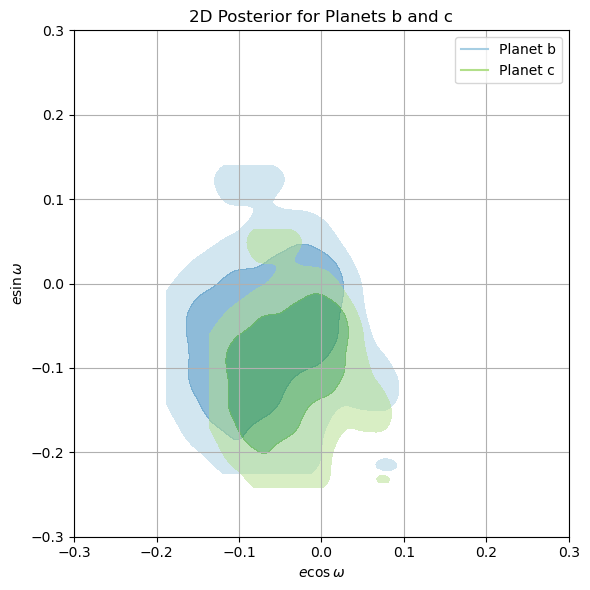

In [73]:
### 2D posterior for ecosw and esinw 
ecosw_b = samples_1000["ecosw"][:, 0]
esinw_b = samples_1000["esinw"][:, 0]

ecosw_c = samples_1000["ecosw"][:, 1]
esinw_c = samples_1000["esinw"][:, 1]

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde


def compute_kde_contour_levels(x, y, gridsize=100):
    data = np.vstack([x, y])
    kde = gaussian_kde(data)
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()
    X, Y = np.mgrid[x_min:x_max:gridsize*1j, y_min:y_max:gridsize*1j]
    positions = np.vstack([X.ravel(), Y.ravel()])
    Z = np.reshape(kde(positions).T, X.shape)
    return X, Y, Z, kde

def get_sigma_contour_levels(Z):
    Z_flat = Z.flatten()
    Z_sorted = np.sort(Z_flat)[::-1]
    cumsum = np.cumsum(Z_sorted)
    cumsum /= cumsum[-1]
    levels = []
    for sigma in [0.683, 0.954]:
        idx = np.searchsorted(cumsum, sigma)
        levels.append(Z_sorted[idx])
    return sorted(levels)  # ensures ascending order

# Compute KDEs
Xb, Yb, Zb, kde_b = compute_kde_contour_levels(ecosw_b, esinw_b)
Xc, Yc, Zc, kde_c = compute_kde_contour_levels(ecosw_c, esinw_c)

# Get contour levels
levels_b = get_sigma_contour_levels(Zb)
levels_c = get_sigma_contour_levels(Zc)

# Plot
fig, ax = plt.subplots(figsize=(6, 6))

# Filled contours for planet b (blue shades)
ax.contourf(Xb, Yb, Zb, levels=levels_b + [Zb.max()], colors=['#a6cee3', '#1f78b4'], alpha=0.5)

# Filled contours for planet c (green shades)
ax.contourf(Xc, Yc, Zc, levels=levels_c + [Zc.max()], colors=['#b2df8a', '#33a02c'], alpha=0.5)

# Labels and legend
ax.set_xlabel(r"$e \cos\omega$")
ax.set_ylabel(r"$e \sin\omega$")
ax.set_title("2D Posterior for Planets b and c")
blue_patch = plt.Line2D([], [], color='#a6cee3', label='Planet b')
red_patch = plt.Line2D([], [], color='#b2df8a', label='Planet c')
ax.legend(handles=[blue_patch, red_patch])

plt.grid(True)
plt.xlim(-0.30,0.30)
plt.ylim(-0.30,0.30)
plt.tight_layout()
plt.show()

In [74]:
az.summary(idata_1000, var_names=["ecc","ecosw_scaled","esinw_scaled", "pmass_scaled","period_scaled","tic_scaled"], round_to=3)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ecc[0],0.114,0.061,0.000,0.214,0.008,0.004,56.329,54.006,1.070
ecc[1],0.122,0.056,0.041,0.242,0.010,0.005,30.802,36.296,1.109
ecosw_scaled[0],0.379,0.120,0.159,0.583,0.008,0.005,218.878,247.341,1.019
ecosw_scaled[1],0.432,0.093,0.259,0.591,0.006,0.004,218.521,241.084,1.019
esinw_scaled[0],0.382,0.148,0.057,0.598,0.028,0.016,26.888,36.350,1.136
esinw_scaled[1],0.298,0.123,0.019,0.473,0.023,0.013,26.873,35.971,1.136
pmass_scaled[0],0.107,0.005,0.100,0.117,0.001,0.000,58.087,99.269,1.067
pmass_scaled[1],0.038,0.001,0.035,0.040,0.000,0.000,291.140,690.898,1.023
period_scaled[0],0.498,0.001,0.495,0.501,0.000,0.000,45.747,281.849,1.076
period_scaled[1],0.513,0.006,0.502,0.523,0.001,0.000,143.070,385.199,1.045


In [75]:
summary_df = az.summary(idata_1000)
rhat = summary_df.loc["pmass[0]","r_hat"]
n_eff = summary_df.loc["pmass[0]","ess_bulk"]
print(f"pmass: R-hat = {rhat:.3f}, n_eff = {n_eff:.0f}")


pmass: R-hat = 1.070, n_eff = 58


In [56]:
# az.summary(idata, round_to=3)
